[![image](https://raw.githubusercontent.com/visual-layer/visuallayer/main/imgs/vl_horizontal_logo.png)](https://www.visual-layer.com)

# Analyzing Roboflow Universe Datasets

[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/visual-layer/fastdup/blob/main/examples/analyzing-kaggle-datasets.ipynb)
[![Open in Kaggle](https://kaggle.com/static/images/open-in-kaggle.svg)](https://kaggle.com/kernels/welcome?src=https://github.com/visual-layer/fastdup/blob/main/examples/analyzing-kaggle-datasets.ipynb)

This notebook shows how you can use [fastdup](https://github.com/visual-layer/fastdup) to analyze any computer vision datasets from [Roboflow Universe](https://universe.roboflow.com/).

## Sign Up and Search Dataset

First, [sign-up for an account](https://app.roboflow.com/) - for free.

You can now search for any dataset on the [platform](https://universe.roboflow.com/) using keywords.

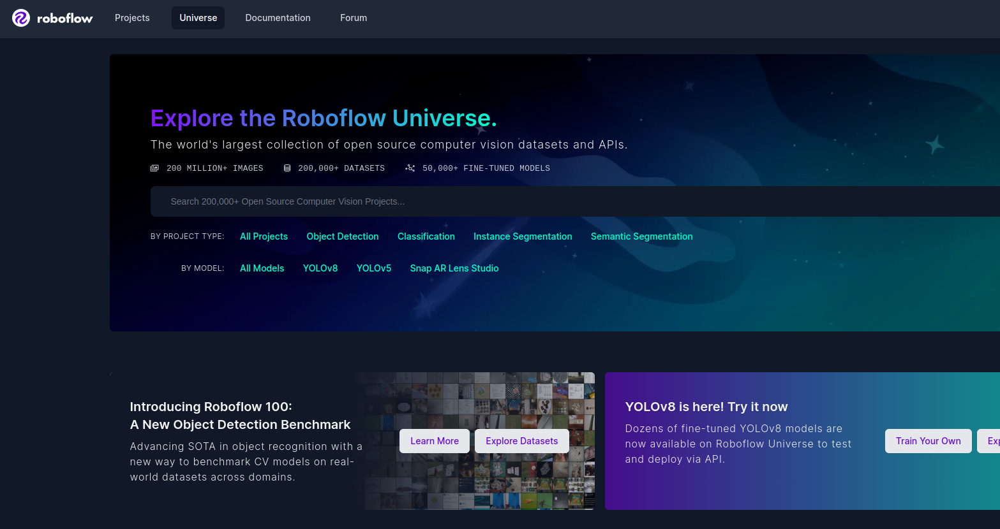

Upon finding your dataset of interest, click on the 'Download Dataset' button on the dataset page.

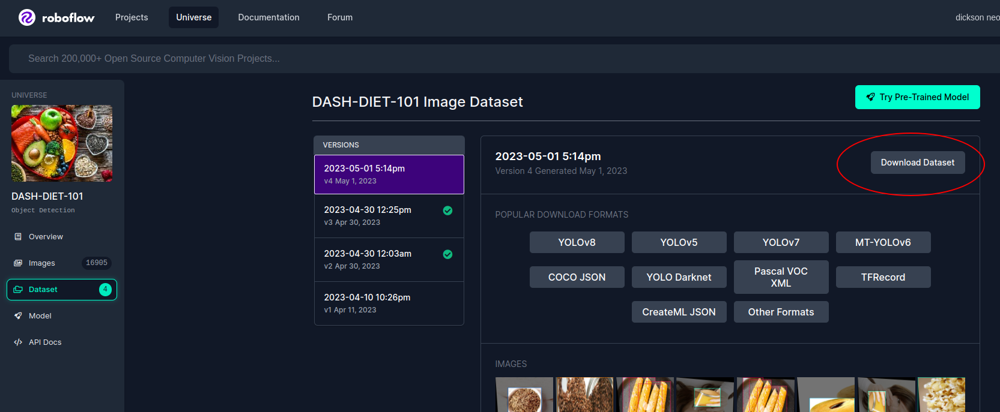

Copy the code snippet into your notebook.

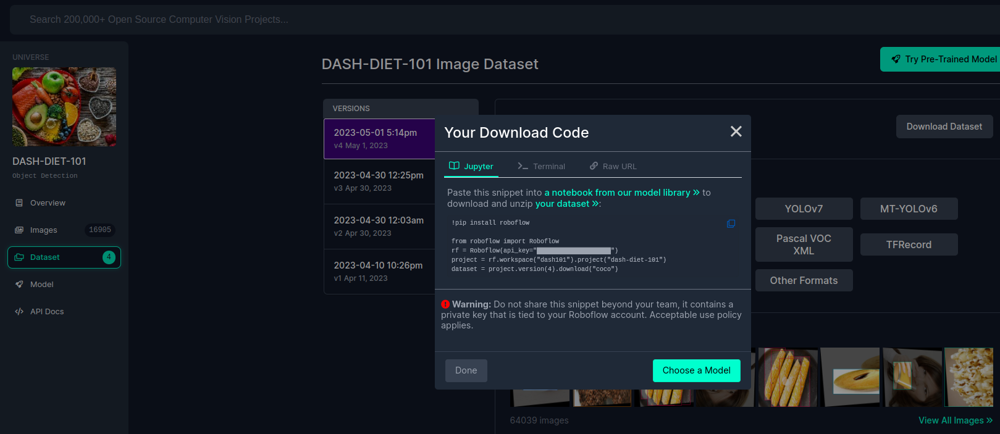

## Install Roboflow Python Package
The Roboflow Python Package is a python wrapper around the core Roboflow web application and REST API.

This package lets us download from over 200,000 datasets from [Roboflow Universe](https://universe.roboflow.com/).

In [9]:
!pip install -Uq roboflow

> Replace `YOUR_API_KEY` with your own API key from Roboflow.

In [10]:
from roboflow import Roboflow
rf = Roboflow(api_key="YOUR_API_KEY")

## Download Dataset

Let's download the [Dash Diet 101 Dataset](https://universe.roboflow.com/dash101/dash-diet-101) in COCO format into our local folder.

DASH-DIET-101 is created by Bhavya Bansal, Nikunj Bansal, Dhruv Sehgal, Yogita Gehani and Ayush Rai with the goal of building a creating model to detect food items that reduce Hypertension. 

It contains more than 16,900 images of 101 popular food items.

In [ ]:
project = rf.workspace("dash101").project("dash-diet-101")
dataset = project.version(4).download("coco")

## Install fastdup

Next, install fastdup and verify the installation.

In [12]:
!pip install -Uq fastdup

Now, test the installation. If there's no error message, we are ready to go.

In [13]:
import fastdup
fastdup.__version__

/usr/bin/dpkg


'1.34'

## Run fastdup
To run fastdup, we only need to point `input_dir` to the folder containing images from the dataset. 

The `annotations` parameter is optional. fastdup works on both labeled and unlabeled datasets. Since this dataset is labeled, et's make use of the labels by passing them into the `run()` method.

In [ ]:
fd = fastdup.create(input_dir='./DASH-DIET-101-4/train')
fd.run(annotations='DASH-DIET-101-4/train/_annotations.coco.json')

## Invalid Bounding Boxes 

Bounding boxes that are either too small or go beyond image boundaries are flagged as bad bounding boxes in fastdup. 

Let's get the invalid bounding boxes:

In [18]:
fd.invalid_instances()

,col_x,row_y,width,height,label,crop_filename,filename,index,is_valid
20121,0,27,413.638,388.924,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.9676c410f32974f8bd53b6c47db156e5.jpg_0_27_413_388.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.9676c410f32974f8bd53b6c47db156e5.jpg,NaN,False
20181,20,0,390.749,415.651,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.a4d236ef9262303f7fc5e96b4304715e.jpg_20_0_390_415.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.a4d236ef9262303f7fc5e96b4304715e.jpg,NaN,False
20492,0,20,413.601,396.000,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.60d7efa443842a8ea2171337e8b6a49a.jpg_0_20_413_396.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.60d7efa443842a8ea2171337e8b6a49a.jpg,NaN,False
20549,27,0,389.000,413.900,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.6c341a80af6fa9f88bd52d8722576e9c.jpg_27_0_389_413.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.6c341a80af6fa9f88bd52d8722576e9c.jpg,NaN,False
20643,20,0,393.171,414.835,Kimchi,work_dir/crops/DASH-DIET-101-4train68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.824f970fd2fda50dcaf15bf12108f10b.jpg_20_0_393_414.jpg,DASH-DIET-101-4/train/68747470733a2f2f73332e616d617a6f6e6177732e636f6d2f776174747061642d6d656469612d736572766963652f53746f7279496d6167652f6a474b624b4c50427234665344673d3d2d3435393632393038312e313464656435353538386337_jpg.rf.824f970fd2fda50dcaf15bf12108f10b.jpg,NaN,False
...,...,...,...,...,...,...,...,...,...
85351,0,122,9.757,38.815,Blackberry,NaN,NaN,NaN,False
85775,27,195,1.082,1.052,White Egg,NaN,NaN,NaN,False
85932,394,195,1.047,1.064,White Egg,NaN,NaN,NaN,False
85963,403,190,1.006,1.076,White Egg,NaN,NaN,NaN,False


We can also get a list of bad bounding boxes by reading the `atrain_features.bad.csv` file.

In [19]:
import pandas as pd
bad_bb = pd.read_csv('work_dir/full_image_run/atrain_features.bad.csv')

In [20]:
bad_bb

,index,filename,error_code
0,23513,DASH-DIET-101-4/train/untitled-2-1-_jpg.rf.2cc0804ad0a8d457291b39d72b32ea1f.jpg,ERROR_BAD_BOUNDING_BOX
1,24030,DASH-DIET-101-4/train/IMG_1282_jpg.rf.e5d454a356160bd444b71e19c9350f72.jpg,ERROR_BAD_BOUNDING_BOX
2,24068,DASH-DIET-101-4/train/IMG_1282_jpg.rf.f669ecf808bd1721e724ef14c7ede206.jpg,ERROR_BAD_BOUNDING_BOX
3,29989,DASH-DIET-101-4/train/Almond_13-Original-Size-_jpg.rf.61e38e0da9a2aa99b20ff801c44a47dd.jpg,ERROR_BAD_BOUNDING_BOX
4,35693,DASH-DIET-101-4/train/carrot_93_jpg.rf.a242faf4608f26c230f476b5feb9f27c.jpg,ERROR_BAD_BOUNDING_BOX
...,...,...,...
17,85351,DASH-DIET-101-4/train/Single-Blackberries_28_jpg.rf.465b276617c3780db8a717ce58c49ba9.jpg,ERROR_BAD_BOUNDING_BOX
18,85775,DASH-DIET-101-4/train/Egg-images_43_jpg.rf.28d73a7161b833d02ef40017086a9948.jpg,ERROR_BAD_BOUNDING_BOX
19,85932,DASH-DIET-101-4/train/Egg-images_43_jpg.rf.0c240a42a1d5a122bf0df56c6737ce1f.jpg,ERROR_BAD_BOUNDING_BOX
20,85963,DASH-DIET-101-4/train/Egg-images_43_jpg.rf.0d7f52ff01b12da4a0e1860cef3755fa.jpg,ERROR_BAD_BOUNDING_BOX


In [21]:
bad_bb['error_code'].value_counts()

error_code
ERROR_BAD_BOUNDING_BOX    22
Name: count, dtype: int64

## Visualize Issues

There are several other methods we can use to inspect and visualize the issues found:

```python
fd.vis.duplicates_gallery()    # create a visual gallery of duplicates
fd.vis.outliers_gallery()      # create a visual gallery of anomalies
fd.vis.component_gallery()     # create a visualization of connected components
fd.vis.stats_gallery()         # create a visualization of images statistics (e.g. blur)
fd.vis.similarity_gallery()    # create a gallery of similar images
```

## Duplicate/Near Duplicates

  0%|                                                                                                                                                                                                                                                                                                                                         | 0/20 [00:00<?, ?it/s]Traceback (most recent call last):
  File "/home/dnth/anaconda3/envs/datapull/lib/python3.10/shutil.py", line 816, in move
    os.rename(src, real_dst)
OSError: [Errno 36] File name too long: 'e0707817-d2e9-495d-9ff5-4428fb792082.jpg' -> 'work_dir/galleries/DASH-DIET-101-4traindark-milk-white-chocolate-transparent-png-7vISxt_jpg.rf.6a069a554545324fca75450a64628e6e.jpg_0_7_415_381_DASH-DIET-101-4traindark-milk-white-chocolate-transparent-png-7vISxt_jpg.rf.6a069a554545324fca75450a64628e6e.jpg_64_5_351_411_14.jpg'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/dnth/an

Failed to generate viz for images work_dir/crops/DASH-DIET-101-4traindark-milk-white-chocolate-transparent-png-7vISxt_jpg.rf.6a069a554545324fca75450a64628e6e.jpg_0_7_415_381.jpg work_dir/crops/DASH-DIET-101-4traindark-milk-white-chocolate-transparent-png-7vISxt_jpg.rf.6a069a554545324fca75450a64628e6e.jpg_64_5_351_411.jpg [Errno 36] File name too long: 'work_dir/galleries/DASH-DIET-101-4traindark-milk-white-chocolate-transparent-png-7vISxt_jpg.rf.6a069a554545324fca75450a64628e6e.jpg_0_7_415_381_DASH-DIET-101-4traindark-milk-white-chocolate-transparent-png-7vISxt_jpg.rf.6a069a554545324fca75450a64628e6e.jpg_64_5_351_411_14.jpg'
Stored similarity visual view in  work_dir/galleries/duplicates.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
######################


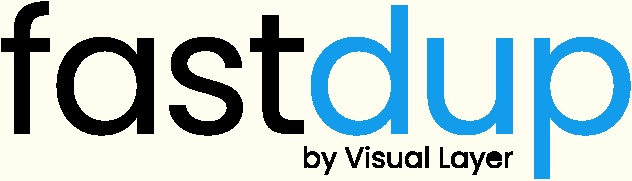
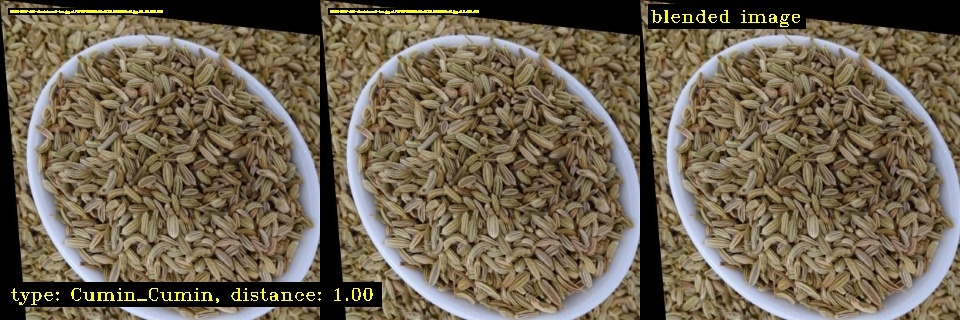
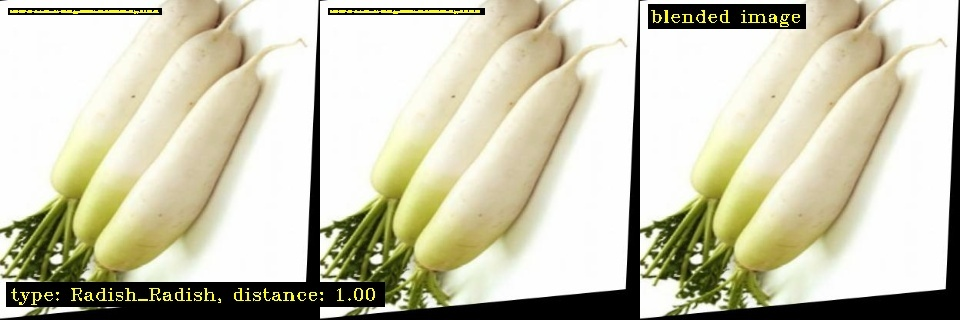
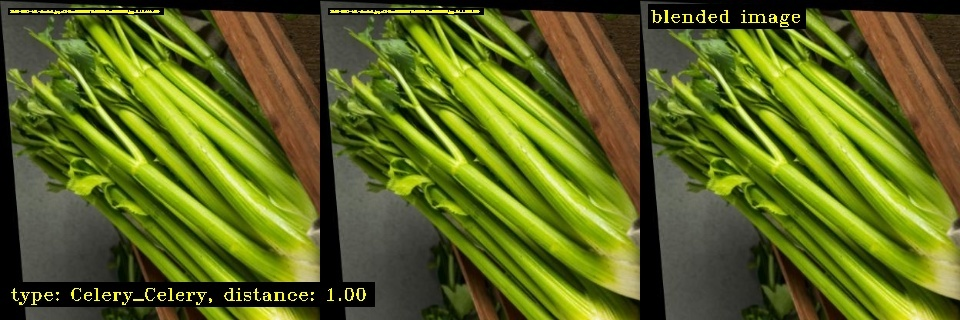
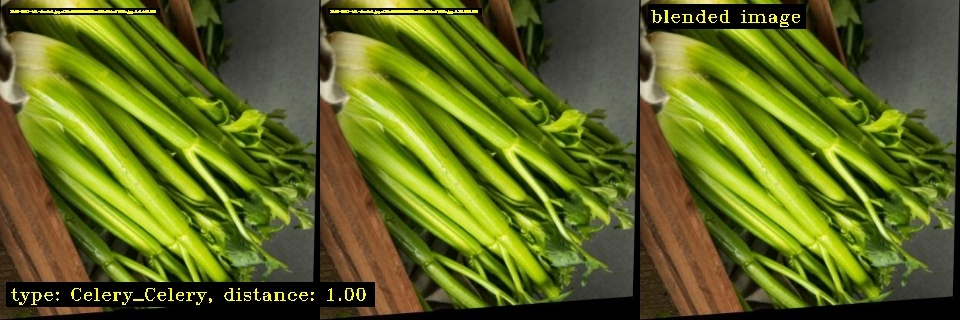
...
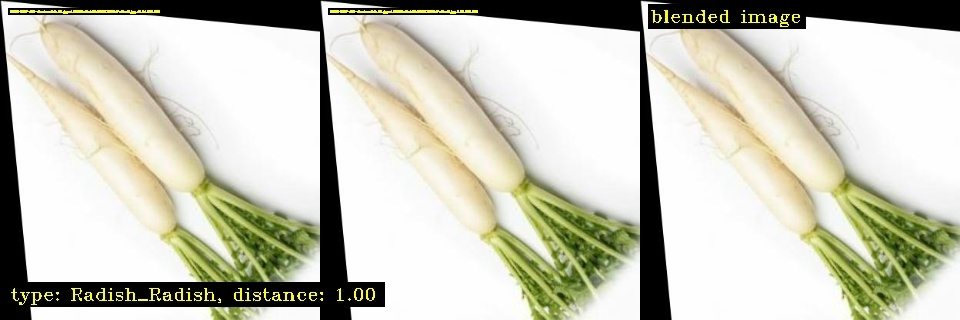
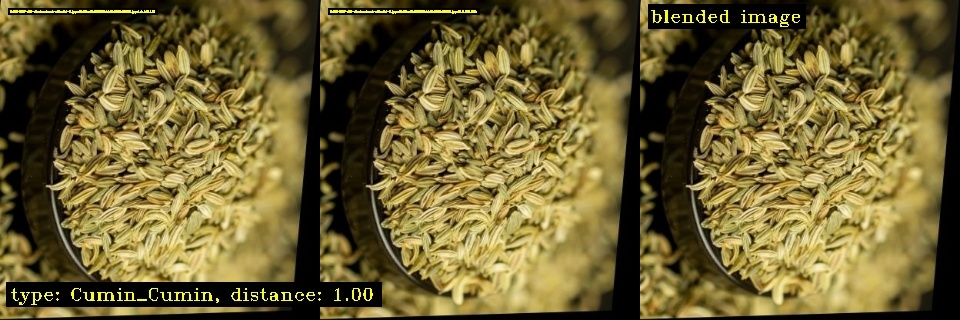
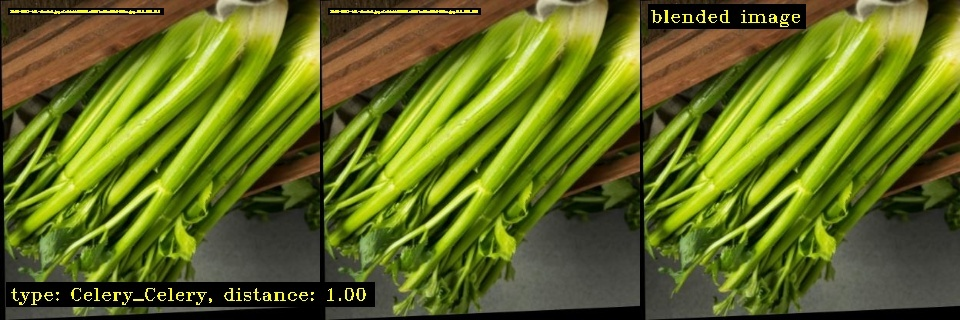
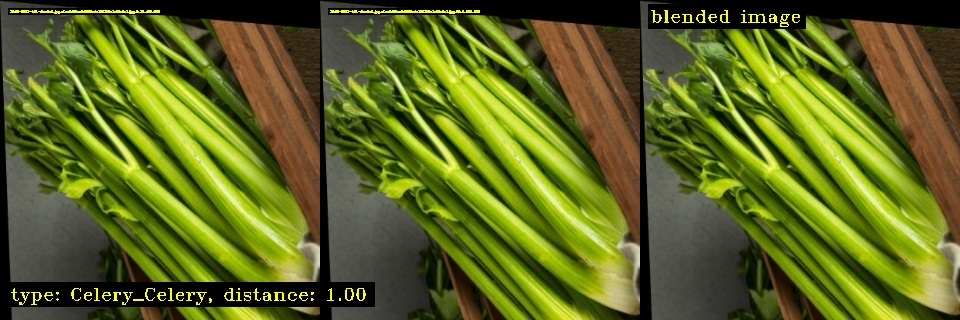
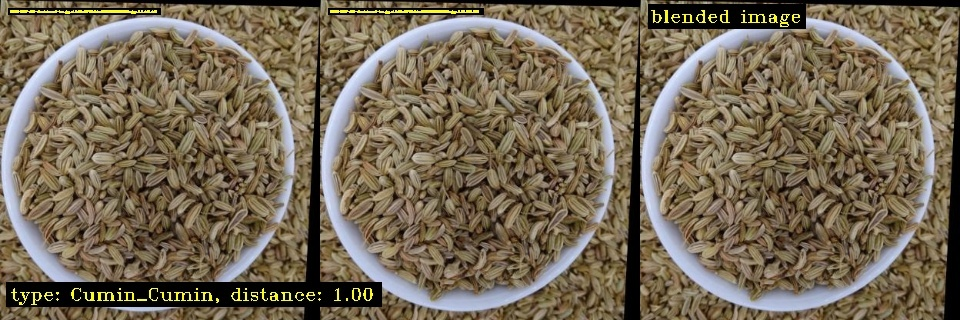

0

In [22]:
fd.vis.duplicates_gallery()

Now let's get the number of exact/near duplicates.

In [25]:
similarity_df = fd.similarity()
near_duplicates = similarity_df[similarity_df["distance"] >= 0.98]

near_duplicates = near_duplicates[['distance', 'crop_filename_from', 'crop_filename_to']]
near_duplicates

,distance,crop_filename_from,crop_filename_to
0,1.000000,work_dir/crops/DASH-DIET-101-4trainfennel-tea_jpg.rf.720767506935a25a2716189fdbb89a62.jpg_31_26_382_389.jpg,work_dir/crops/DASH-DIET-101-4trainfennel-tea_jpg.rf.720767506935a25a2716189fdbb89a62.jpg_0_0_416_416.jpg
1,1.000000,work_dir/crops/DASH-DIET-101-4trainaniseed-editorial-2_jpg.rf.b445ce541100767c16e7cf87301575d7.jpg_0_0_416_416.jpg,work_dir/crops/DASH-DIET-101-4trainaniseed-editorial-2_jpg.rf.b445ce541100767c16e7cf87301575d7.jpg_52_6_327_396.jpg
2,1.000000,work_dir/crops/DASH-DIET-101-4trainfennel-tea_jpg.rf.dc86af67b7efcba08b1f79d800f5923a.jpg_0_0_416_416.jpg,work_dir/crops/DASH-DIET-101-4trainfennel-tea_jpg.rf.dc86af67b7efcba08b1f79d800f5923a.jpg_9_30_382_365.jpg
3,1.000000,work_dir/crops/DASH-DIET-101-4trainaniseed-editorial-2_jpg.rf.9220aa36583b357580b901b4a0a86485.jpg_17_37_398_320.jpg,work_dir/crops/DASH-DIET-101-4trainaniseed-editorial-2_jpg.rf.9220aa36583b357580b901b4a0a86485.jpg_0_0_416_416.jpg
4,1.000000,work_dir/crops/DASH-DIET-101-4trainaniseed-editorial-2_jpg.rf.9220aa36583b357580b901b4a0a86485.jpg_0_0_416_416.jpg,work_dir/crops/DASH-DIET-101-4trainaniseed-editorial-2_jpg.rf.9220aa36583b357580b901b4a0a86485.jpg_17_37_398_320.jpg
...,...,...,...
20383,0.980005,work_dir/crops/DASH-DIET-101-4trainsingle-kaju-nut_20_jpg.rf.7005ea6ceacad58660575a9c14c624fb.jpg_48_96_346_190.jpg,work_dir/crops/DASH-DIET-101-4trainsingle-kaju-nut_20_jpg.rf.1bb90664a0a2e85e951dae0ef0b84930.jpg_43_126_340_180.jpg
20384,0.980003,work_dir/crops/DASH-DIET-101-4trainwatermelon-4_jpg.rf.d4a1577ab61b76fae5502d65d4c3df6b.jpg_102_30_286_386.jpg,work_dir/crops/DASH-DIET-101-4trainwatermelon-4_jpg.rf.84712075e87db0aae29e1f50afed9267.jpg_101_28_270_388.jpg
20385,0.980003,work_dir/crops/DASH-DIET-101-4trainwatermelon-4_jpg.rf.84712075e87db0aae29e1f50afed9267.jpg_101_28_270_388.jpg,work_dir/crops/DASH-DIET-101-4trainwatermelon-4_jpg.rf.d4a1577ab61b76fae5502d65d4c3df6b.jpg_102_30_286_386.jpg
20386,0.980003,work_dir/crops/DASH-DIET-101-4trainR-1_jpg.rf.00f7c3e0c3b443aa1b4b5a04dc6f26eb.jpg_180_101_216_209.jpg,work_dir/crops/DASH-DIET-101-4trainR-1_jpg.rf.f5a1151cb95e5bbc7d04efb70c805ab0.jpg_193_107_208_215.jpg


A `distance` value of `1.0` indicates an exact duplicate.

As a sanity check, let's show the images that are flagged as duplicates here.

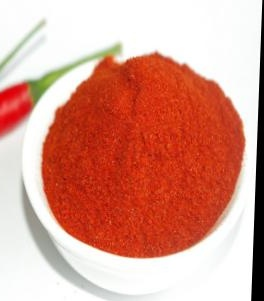

In [26]:
from IPython.display import Image
Image(filename="work_dir/crops/DASH-DIET-101-4trainR-1_jpg.rf.f5a1151cb95e5bbc7d04efb70c805ab0.jpg_193_107_208_215.jpg")

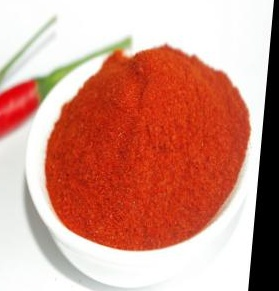

In [27]:
Image(filename="work_dir/crops/DASH-DIET-101-4trainR-1_jpg.rf.00f7c3e0c3b443aa1b4b5a04dc6f26eb.jpg_180_101_216_209.jpg")

## Image Clusters

Turmeric Powder


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 27.98it/s]


Finished OK. Components are stored as image files work_dir/galleries/components_[index].jpg
Stored components visual view in  work_dir/galleries/components.html
Execution time in seconds 5.8
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



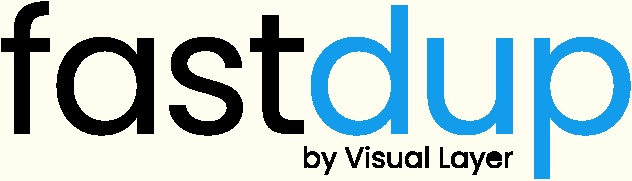
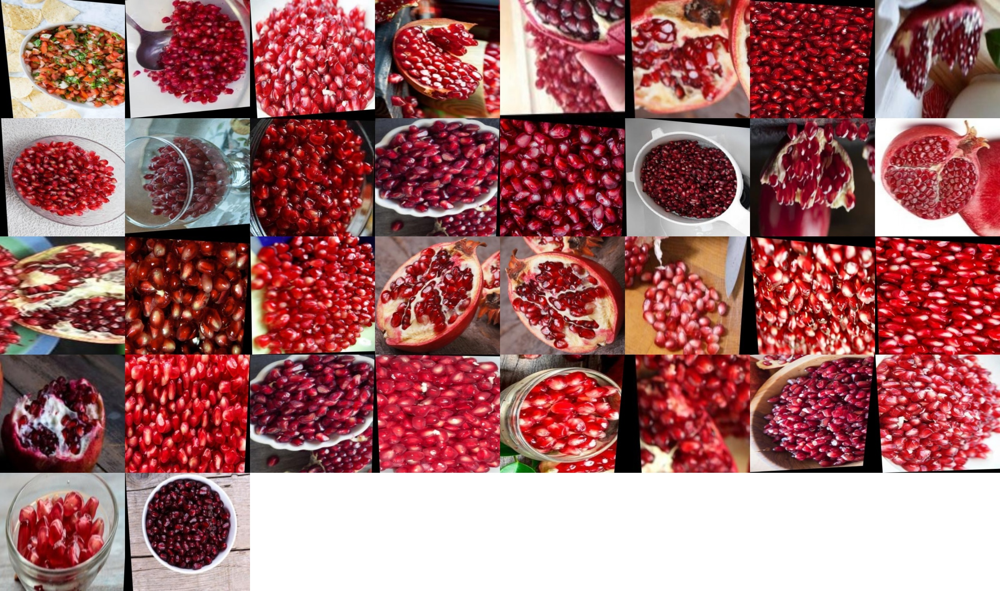
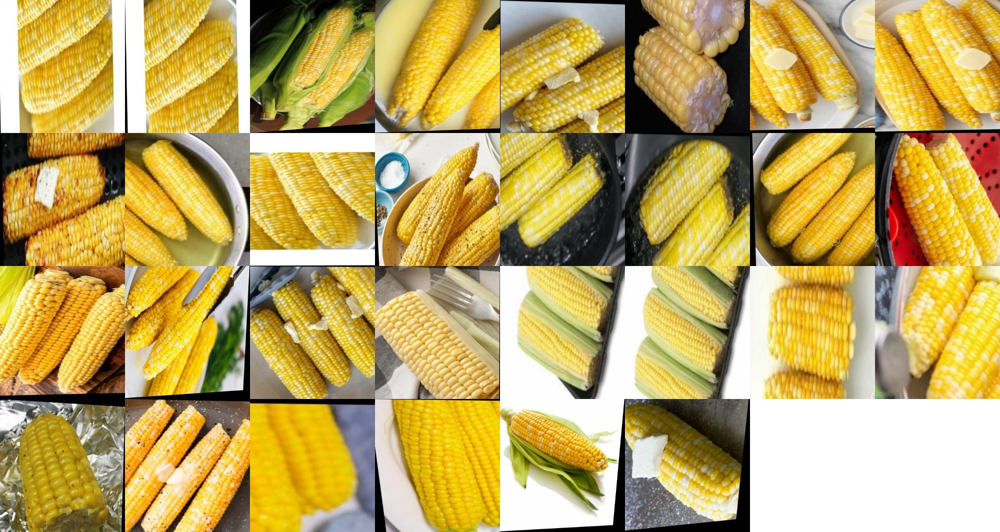
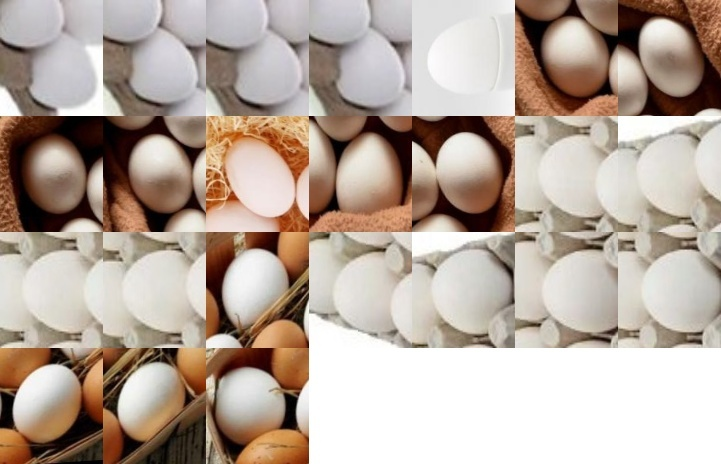
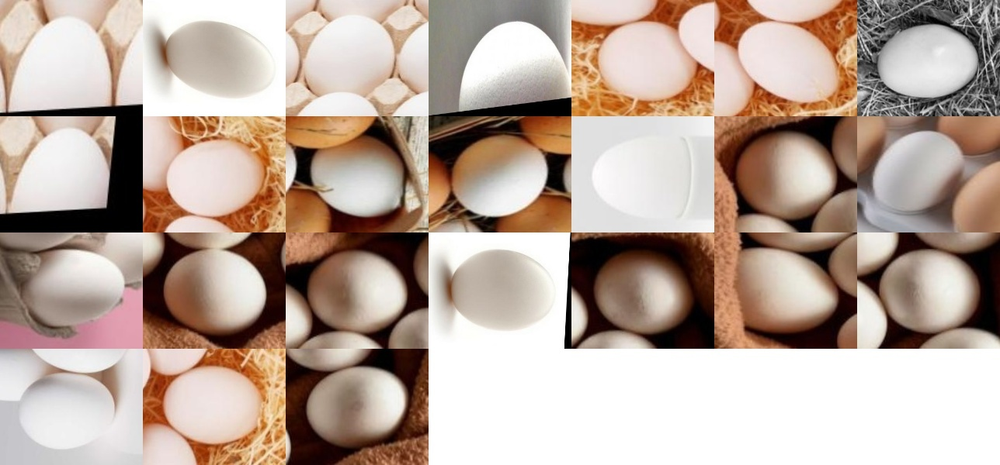
...
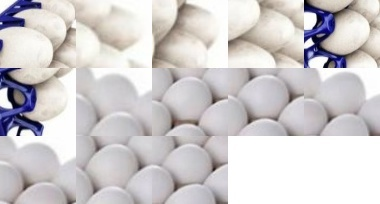
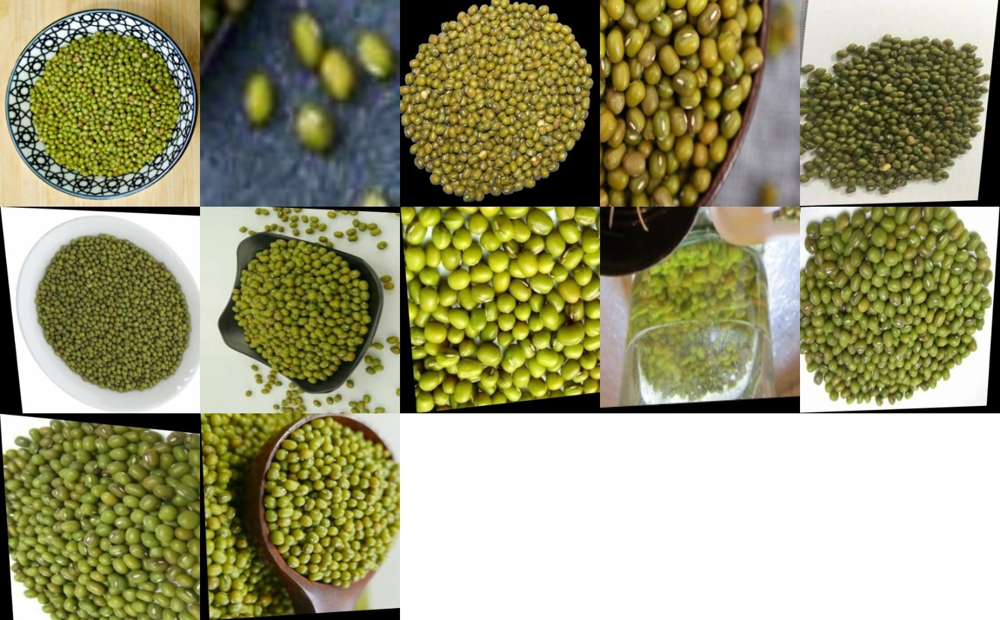
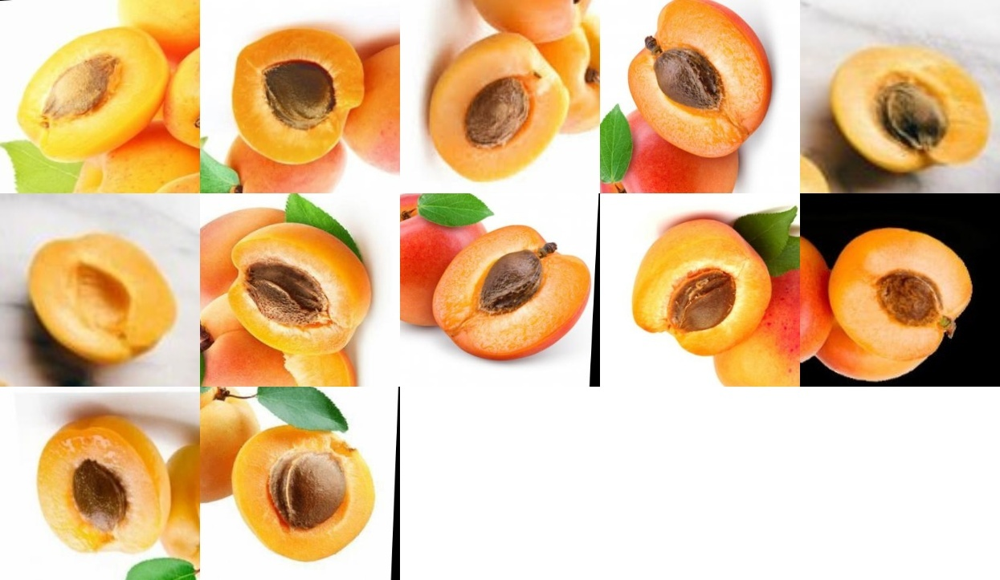
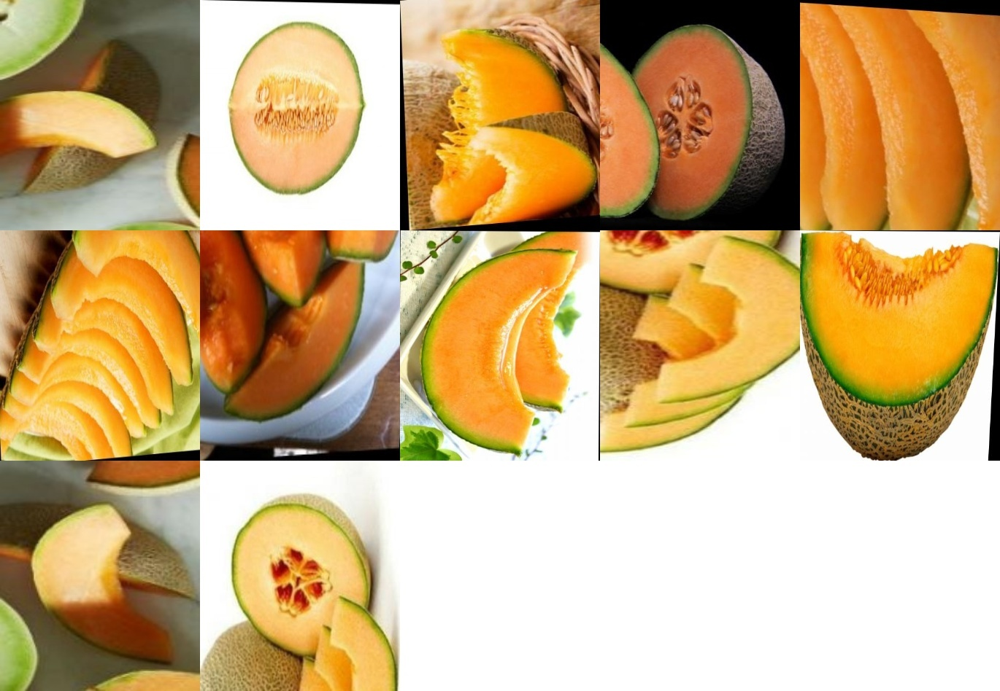
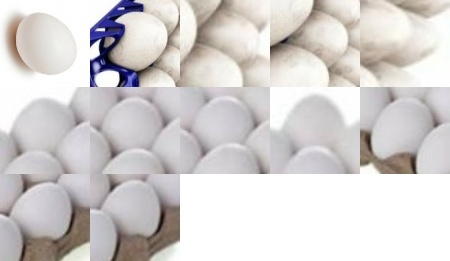

0

In [28]:
fd.vis.component_gallery()

## Statistical Gallery
We can show the brightest images from the dataset in a gallery.


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 348.18it/s]

A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Stored mean visual view in  work_dir/galleries/mean.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



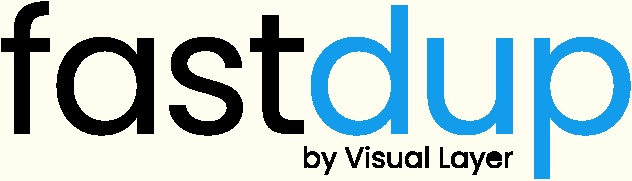
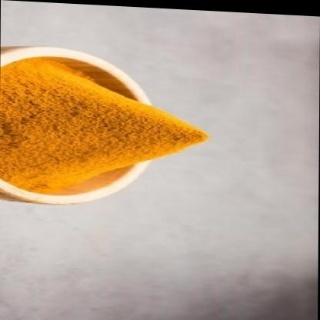
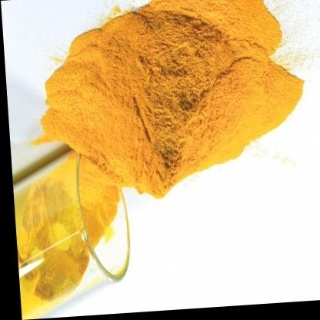
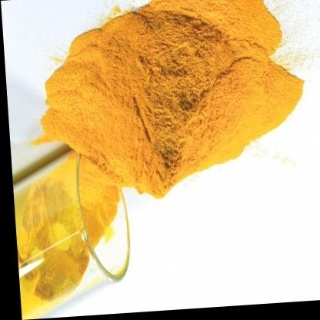
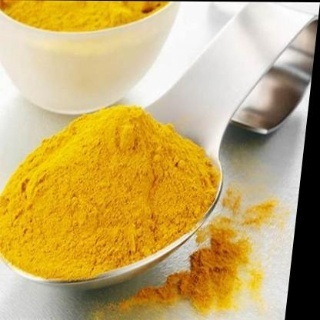
...
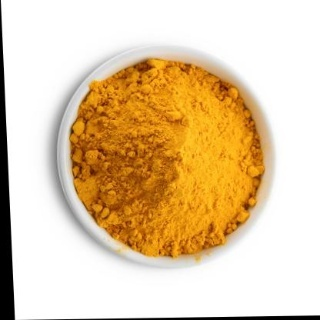
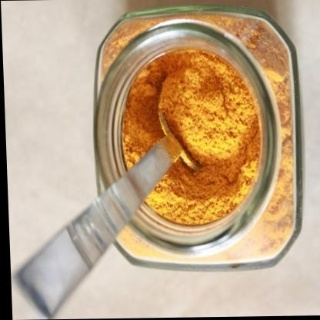
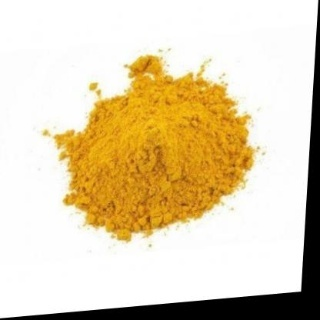
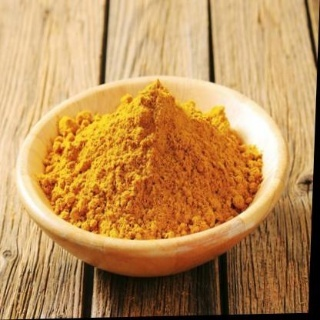
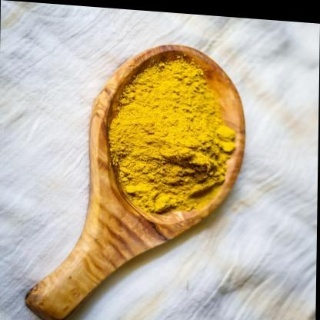

0

In [32]:
fd.vis.stats_gallery(metric='bright')

## Similarity Gallery

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 20/20 [00:00<00:00, 102.77it/s]


Stored similar images visual view in  work_dir/galleries/similarity.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



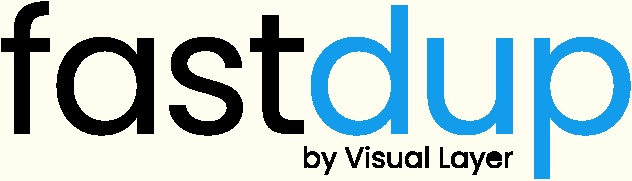
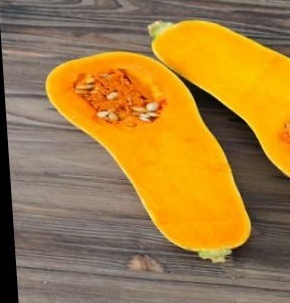
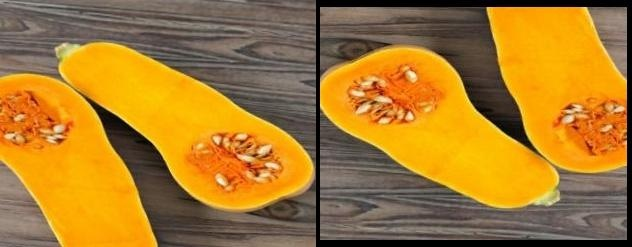
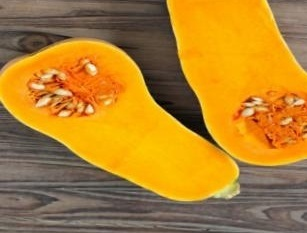
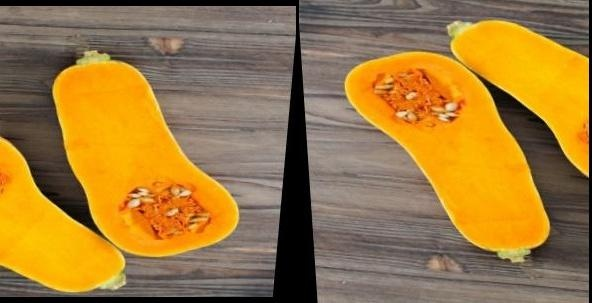
...
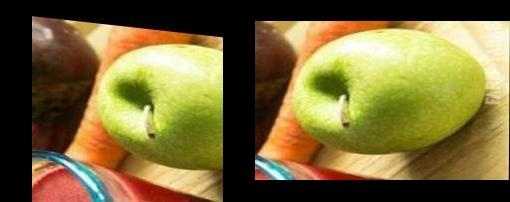
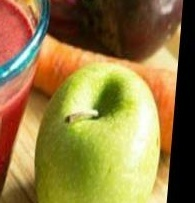
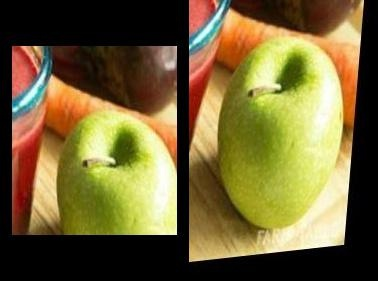
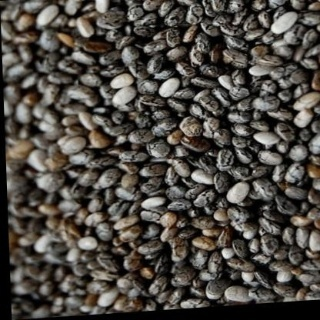
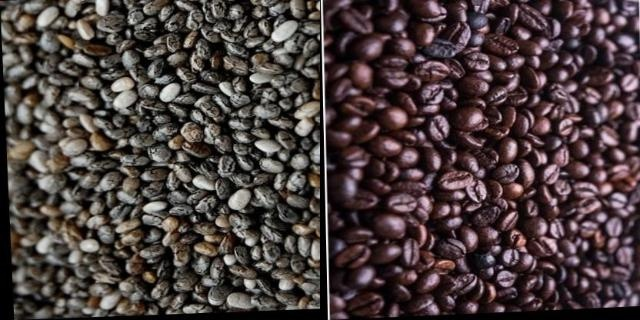

,from,to,label,label2,distance,score,length
33660,work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.3f60f16b0b3f608c9334249ab5d256c1.jpg_48_125_208_217.jpg,"[work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.d4c7ea155dfc6b23567a265feaea058c.jpg_0_172_256_167.jpg, work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.3f60f16b0b3f608c9334249ab5d256c1.jpg_152_95_262_177.jpg]","[Cabbage, Cabbage]","[Butternut Squash, Butternut Squash]","[0.921751, 0.946037]",0.0,2
33841,work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.d4c7ea155dfc6b23567a265feaea058c.jpg_0_172_256_167.jpg,"[work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.3f60f16b0b3f608c9334249ab5d256c1.jpg_48_125_208_217.jpg, work_dir/crops/DASH-DIET-101-4trainR-2-_jpg.rf.d4c7ea155dfc6b23567a265feaea058c.jpg_156_95_212_209.jpg]","[Butternut Squash, Butternut Squash]","[Cabbage, Cabbage]","[0.921751, 0.939066]",0.0,2
49566,work_dir/crops/DASH-DIET-101-4traincantaloupe_37_jpg.rf.7a0f7d29db52e2891b75e76f0def016b.jpg_5_264_306_152.jpg,"[work_dir/crops/DASH-DIET-101-4traincantaloupe_37_jpg.rf.0fd526591ebaf21d3be7ebd9a91f76a7.jpg_168_206_248_137.jpg, work_dir/crops/DASH-DIET-101-4traincantaloupe_37_jpg.rf.7a0f7d29db52e2891b75e76f0def016b.jpg_172_234_244_147.jpg]","[Cantaloupe, Cantaloupe]","[Honeydew Melon, Honeydew Melon]","[0.926915, 0.934811]",0.0,2
70783,work_dir/crops/DASH-DIET-101-4trainraw-black-eyed-peas_58_jpg.rf.a6749033b65b6dfe61e0f08cefb99638.jpg_0_0_416_415.jpg,"[work_dir/crops/DASH-DIET-101-4trainOIP-2-_jpg.rf.e98ee490a0b198088426d4e149f314bc.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainmIiR4LG_jpg.rf.ae8dda4a436b57d53ca92ade2d16d2e9.jpg_0_0_416_416.jpg]","[Black-eyed peas, Black-eyed peas]","[Barley, Barley]","[0.902716, 0.905886]",0.0,2
728,work_dir/crops/DASH-DIET-101-4train062-1_jpg.rf.b9171784d0840c1a7a897679476fb58b.jpg_7_0_255_256.jpg,"[work_dir/crops/DASH-DIET-101-4train062-1_jpg.rf.b9171784d0840c1a7a897679476fb58b.jpg_58_31_276_342.jpg, work_dir/crops/DASH-DIET-101-4train062-1_jpg.rf.7b7666b90a254bf5bd7147c973475782.jpg_11_0_251_256.jpg]","[Coriander, Coriander]","[Guacamole, Coriander]","[0.942884, 0.969112]",50.0,2
...,...,...,...,...,...,...,...
79737,work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.008bfdce21926d983f232c135a60c1cd.jpg_0_0_416_416.jpg,"[work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.c5afc6dd4db02f778cd1edec9d7eef21.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.a80491250152838364d47c21c20b5b65.jpg_0_0_416_416.jpg]","[Kimchi, Kimchi]","[Kimchi, Kimchi]","[0.964825, 0.977222]",100.0,2
79738,work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.2ed9f9348082476ab79a73514c665db0.jpg_0_0_416_416.jpg,"[work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.008bfdce21926d983f232c135a60c1cd.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.9abfafea9e8bd2e11a9c92fcfa053397.jpg_0_0_416_416.jpg]","[Kimchi, Kimchi]","[Kimchi, Kimchi]","[0.938893, 0.958767]",100.0,2
79739,work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.9abfafea9e8bd2e11a9c92fcfa053397.jpg_0_0_416_416.jpg,"[work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.008bfdce21926d983f232c135a60c1cd.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.2ed9f9348082476ab79a73514c665db0.jpg_0_0_416_416.jpg]","[Kimchi, Kimchi]","[Kimchi, Kimchi]","[0.931318, 0.958767]",100.0,2
79740,work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.a80491250152838364d47c21c20b5b65.jpg_0_0_416_416.jpg,"[work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.c5afc6dd4db02f778cd1edec9d7eef21.jpg_0_0_416_416.jpg, work_dir/crops/DASH-DIET-101-4trainzw7xzsuc4ga41_jpg.rf.008bfdce21926d983f232c135a60c1cd.jpg_0_0_416_416.jpg]","[Kimchi, Kimchi]","[Kimchi, Kimchi]","[0.963139, 0.977222]",100.0,2


In [30]:
fd.vis.similarity_gallery(slice='diff')

## Wrap Up

That's a wrap! In this notebook we showed how you load dataset from Kaggle and analyze it using fastdup. You can use similar methods to run on other similar datasets on [Roboflow Universe](https://universe.roboflow.com/).

Try it out and let us know what issues you find.


Next, feel free to check out other tutorials -

+ ⚡ [**Quickstart**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/quick-dataset-analysis.ipynb): Learn how to install fastdup, load a dataset and analyze it for potential issues such as duplicates/near-duplicates, broken images, outliers, dark/bright/blurry images, and view visually similar image clusters. If you're new, start here!
+ 🧹 [**Clean Image Folder**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/cleaning-image-dataset.ipynb): Learn how to analyze and clean a folder of images from potential issues and export a list of problematic files for further action. If you have an unorganized folder of images, this is a good place to start.
+ 🖼 [**Analyze Image Classification Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-image-classification-dataset.ipynb): Learn how to load a labeled image classification dataset and analyze for potential issues. If you have labeled ImageNet-style folder structure, have a go!
+ 🎁 [**Analyze Object Detection Dataset**](https://nbviewer.org/github/visual-layer/fastdup/blob/main/examples/analyzing-object-detection-dataset.ipynb): Learn how to load bounding box annotations for object detection and analyze for potential issues. If you have a COCO-style labeled object detection dataset, give this example a try. 


# VL Profiler
If you prefer a no-code platform to inspect and visualize your dataset, [**try our free cloud product VL Profiler**](https://app.visual-layer.com) - VL Profiler is our first no-code commercial product that lets you visualize and inspect your dataset in your browser. 

[Sign up](https://app.visual-layer.com) now, it's free.

[![image](https://raw.githubusercontent.com/visual-layer/fastdup/main/gallery/vl_profiler_promo.svg)](https://app.visual-layer.com)

As usual, feedback is welcome! 

Questions? Drop by our [Slack channel](https://visualdatabase.slack.com/join/shared_invite/zt-19jaydbjn-lNDEDkgvSI1QwbTXSY6dlA#/shared-invite/email) or open an issue on [GitHub](https://github.com/visual-layer/fastdup/issues).